<a href="https://colab.research.google.com/github/hansuho113/SwUniv_CancerAnalysis/blob/main/HeeSeon/Colab_Notebook/yolo_success.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import cv2
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt

In [ ]:
!git clone https://github.com/pjreddie/darknet

Cloning into 'darknet'...
remote: Enumerating objects: 5934, done.
remote: Total 5934 (delta 0), reused 0 (delta 0), pack-reused 5934
Receiving objects: 100% (5934/5934), 6.35 MiB | 29.81 MiB/s, done.
Resolving deltas: 100% (3926/3926), done.


In [ ]:
%cd darknet

/content/darknet


In [ ]:
!make

mkdir -p obj
mkdir -p backup
mkdir -p results
gcc -Iinclude/ -Isrc/ -Wall -Wno-unused-result -Wno-unknown-pragmas -Wfatal-errors -fPIC -Ofast -c ./src/gemm.c -o obj/gemm.o
gcc -Iinclude/ -Isrc/ -Wall -Wno-unused-result -Wno-unknown-pragmas -Wfatal-errors -fPIC -Ofast -c ./src/utils.c -o obj/utils.o
gcc -Iinclude/ -Isrc/ -Wall -Wno-unused-result -Wno-unknown-pragmas -Wfatal-errors -fPIC -Ofast -c ./src/cuda.c -o obj/cuda.o
gcc -Iinclude/ -Isrc/ -Wall -Wno-unused-result -Wno-unknown-pragmas -Wfatal-errors -fPIC -Ofast -c ./src/deconvolutional_layer.c -o obj/deconvolutional_layer.o
gcc -Iinclude/ -Isrc/ -Wall -Wno-unused-result -Wno-unknown-pragmas -Wfatal-errors -fPIC -Ofast -c ./src/convolutional_layer.c -o obj/convolutional_layer.o
gcc -Iinclude/ -Isrc/ -Wall -Wno-unused-result -Wno-unknown-pragmas -Wfatal-errors -fPIC -Ofast -c ./src/list.c -o obj/list.o
gcc -Iinclude/ -Isrc/ -Wall -Wno-unused-result -Wno-unknown-pragmas -Wfatal-errors -fPIC -Ofast -c ./src/image.c -o obj/image.o
gcc 

In [ ]:
!wget https://pjreddie.com/media/files/yolov3.weights

--2021-06-23 08:34:45--  https://pjreddie.com/media/files/yolov3.weights
Resolving pjreddie.com (pjreddie.com)... 128.208.4.108
Connecting to pjreddie.com (pjreddie.com)|128.208.4.108|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 248007048 (237M) [application/octet-stream]
Saving to: ‘yolov3.weights’

yolov3.weights      100%[===================>] 236.52M  46.3MB/s    in 5.5s    

2021-06-23 08:34:51 (43.0 MB/s) - ‘yolov3.weights’ saved [248007048/248007048]



In [ ]:
from google.colab import files
files.upload()

Saving cup.jpg to cup.jpg


{'cup.jpg': b'\xff\xd8\xff\xe1)\xfbExif\x00\x00MM\x00*\x00\x00\x00\x08\x00\x0c\x01\x00\x00\x03\x00\x00\x00\x01\x0c\xc0\x00\x00\x01\x10\x00\x02\x00\x00\x00\t\x00\x00\x00\x9e\x01\x01\x00\x03\x00\x00\x00\x01\t\x90\x00\x00\x01\x12\x00\x03\x00\x00\x00\x01\x00\x06\x00\x00\x012\x00\x02\x00\x00\x00\x14\x00\x00\x00\xa7\x02\x13\x00\x03\x00\x00\x00\x01\x00\x01\x00\x00\x87i\x00\x04\x00\x00\x00\x01\x00\x00\x00\xcb\x01(\x00\x03\x00\x00\x00\x01\x00\x02\x00\x00\x88%\x00\x04\x00\x00\x00\x01\x00\x00\x04^\x01\x1a\x00\x05\x00\x00\x00\x01\x00\x00\x00\xbb\x01\x1b\x00\x05\x00\x00\x00\x01\x00\x00\x00\xc3\x01\x0f\x00\x02\x00\x00\x00\x04LGE\x00\x00\x00\x04dLM-G900N\x002021:06:23 17:28:36\x00\x00\x00\x00H\x00\x00\x00\x01\x00\x00\x00H\x00\x00\x00\x01\x00 \x88\'\x00\x03\x00\x00\x00\x01\x00d\x00\x00\x88"\x00\x03\x00\x00\x00\x01\x00\x02\x00\x00\x82\x9d\x00\x05\x00\x00\x00\x01\x00\x00\x02Q\x82\x9a\x00\x05\x00\x00\x00\x01\x00\x00\x02Y\xa2\x17\x00\x03\x00\x00\x00\x01\x00\x01\x00\x00\x92\x92\x00\x02\x00\x00\x00\x07\x00\

In [ ]:
img = cv2.imread('cup.jpg')
print(type(img))

<class 'numpy.ndarray'>


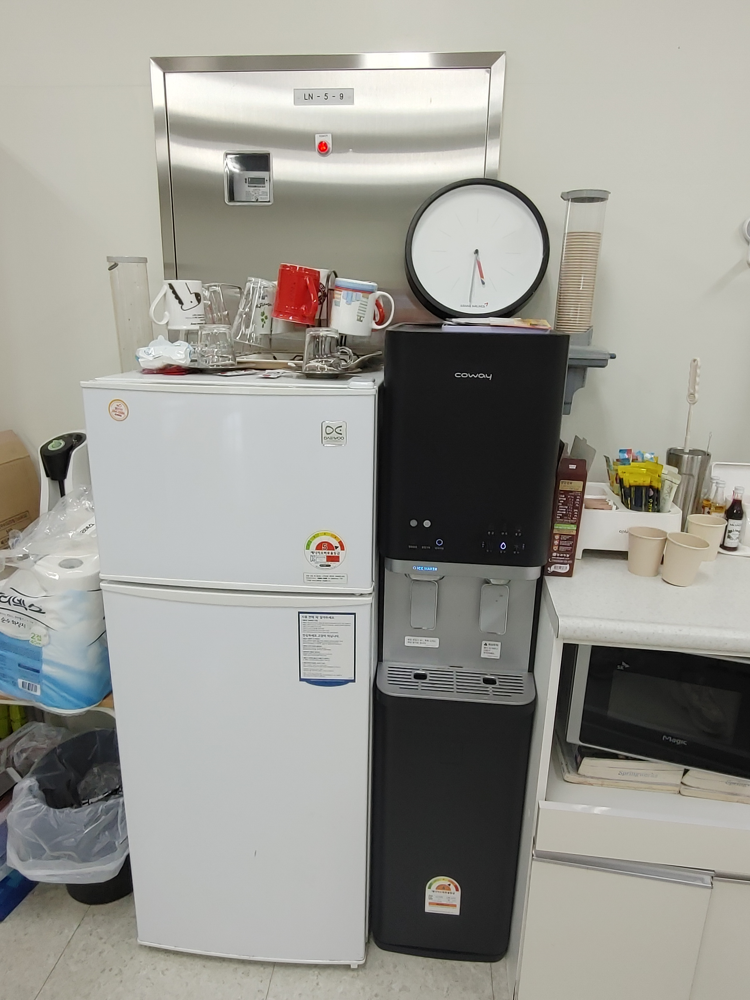

In [ ]:
cv2_imshow(img)

In [ ]:
img.shape

(3264, 2448, 3)

In [ ]:
dst = cv2.resize(img, None, fx=0.3, fy=0.2, interpolation=cv2.INTER_AREA)

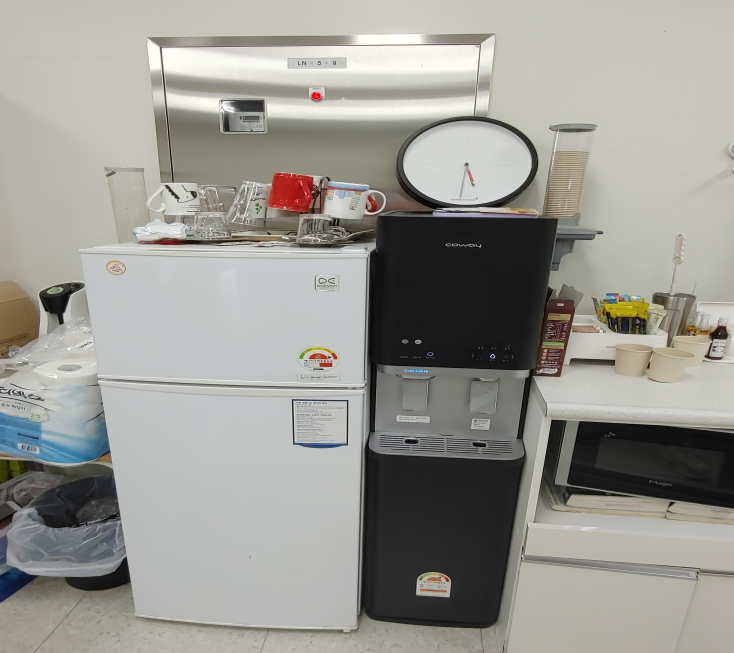

(653, 734, 3)


In [ ]:
cv2_imshow(dst)
print(dst.shape)

In [ ]:
cv2.imwrite('/content/darknet/data/cup.jpg', dst)

True

In [ ]:
!./darknet detect cfg/yolov3.cfg yolov3.weights data/cup.jpg

layer     filters    size              input                output
    0 conv     32  3 x 3 / 1   608 x 608 x   3   ->   608 x 608 x  32  0.639 BFLOPs
    1 conv     64  3 x 3 / 2   608 x 608 x  32   ->   304 x 304 x  64  3.407 BFLOPs
    2 conv     32  1 x 1 / 1   304 x 304 x  64   ->   304 x 304 x  32  0.379 BFLOPs
    3 conv     64  3 x 3 / 1   304 x 304 x  32   ->   304 x 304 x  64  3.407 BFLOPs
    4 res    1                 304 x 304 x  64   ->   304 x 304 x  64
    5 conv    128  3 x 3 / 2   304 x 304 x  64   ->   152 x 152 x 128  3.407 BFLOPs
    6 conv     64  1 x 1 / 1   152 x 152 x 128   ->   152 x 152 x  64  0.379 BFLOPs
    7 conv    128  3 x 3 / 1   152 x 152 x  64   ->   152 x 152 x 128  3.407 BFLOPs
    8 res    5                 152 x 152 x 128   ->   152 x 152 x 128
    9 conv     64  1 x 1 / 1   152 x 152 x 128   ->   152 x 152 x  64  0.379 BFLOPs
   10 conv    128  3 x 3 / 1   152 x 152 x  64   ->   152 x 152 x 128  3.407 BFLOPs
   11 res    8                 152 x 

In [ ]:
!pip install Pillow

In [ ]:
from PIL import Image

In [ ]:
im = Image.open('/content/darknet/predictions.jpg')

print(im.size)

(734, 653)


In [ ]:
im.save('cup_pred.jpg')

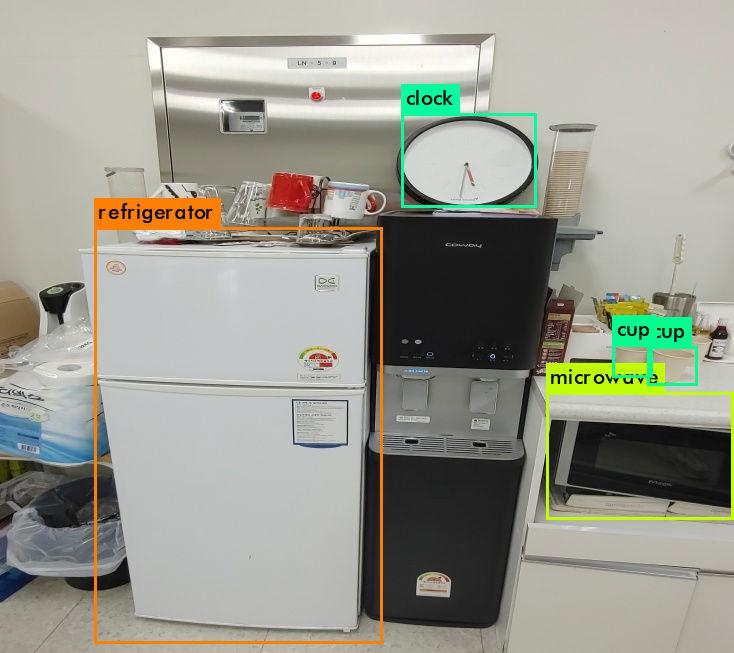

In [ ]:
cup_pred = cv2.imread('/content/darknet/cup_pred.jpg')
cv2_imshow(cup_pred)